In [2]:
# STEP 2: Imports & Setup
import pandas as pd
import seaborn as sns
import os
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
from IPython.display import Audio, display
import noisereduce as nr

folder_path = '/home/friday/Programss/drive-download'

In [3]:
#  give the actual file name
file_path = '/home/friday/Programss/drive-download/Respiratory_Hypopnea_12438.5_12451.0.wav'
y, sr = librosa.load(file_path)

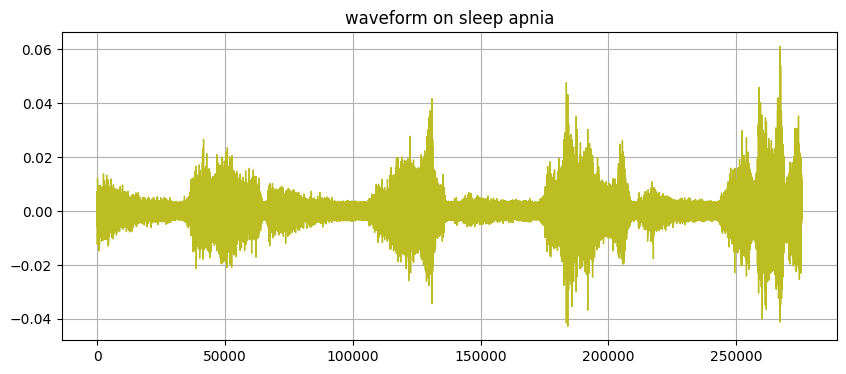

In [4]:

color_pal= sns.color_palette()

pd.Series(y).plot(figsize=(10,4), lw=1, 
                  title="waveform on sleep apnia",
                  color= color_pal[8])  #number is for color

plt.grid()
plt.show()

In [5]:
# STEP 3: Organize files by category and timestamps
file_structure = defaultdict(dict)
wav_files = [f for f in os.listdir(folder_path) if f.endswith('.wav')]

for f in wav_files:
    parts = f.replace('.wav', '').split('_')
    main_category = "_".join(parts[:2])
    timestamp = "_".join(parts[2:])  # e.g., 11912.5_11926.5
    full_path = os.path.join(folder_path, f)
    file_structure[main_category][timestamp] = full_path

# Map numbers to categories
category_map = {
    '1': 'Respiratory_Hypopnea',
    '2': 'Respiratory_ObstructiveApnea',
    '3': 'Respiratory_MixedApnea'
}


In [6]:
# STEP 4: Feature display helper
def show_features(y, sr, title):
    y_trimmed, _ = librosa.effects.trim(y)

    # Estimate noise from first 0.5s
    noise_sample = y_trimmed[:int(0.5 * sr)]

    # Apply spectral noise reduction
    y_denoised = nr.reduce_noise(y=y_trimmed, sr=sr, y_noise=noise_sample)

    # Now use the cleaned version
    y = y_denoised
    print(" Playing audio:")
    display(Audio(y, rate=sr))

    plt.figure(figsize=(10, 3))
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'{title} - Waveform')
    plt.tight_layout()
    plt.show()

    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'{title} - Spectrogram')
    plt.tight_layout()
    plt.show()

    zcr = librosa.feature.zero_crossing_rate(y)
    mean_zcr = np.mean(zcr)
    print(f" Mean Zero Crossing Rate: {mean_zcr:.5f}")
    plt.figure(figsize=(10, 3))
    plt.plot(librosa.times_like(zcr), zcr[0])
    plt.title(f'{title} - Zero Crossing Rate')
    plt.tight_layout()
    plt.show()



 Choose a category to explore:
1: Respiratory_Hypopnea
2: Respiratory_ObstructiveApnea
3: Respiratory_MixedApnea
q: Quit

 Exploring: Respiratory_Hypopnea (35 segments)

 Subcategory: 10810.5_10820.5
 Playing audio:


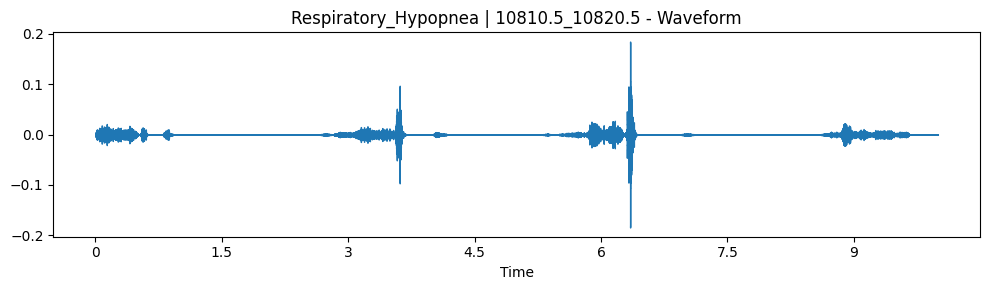

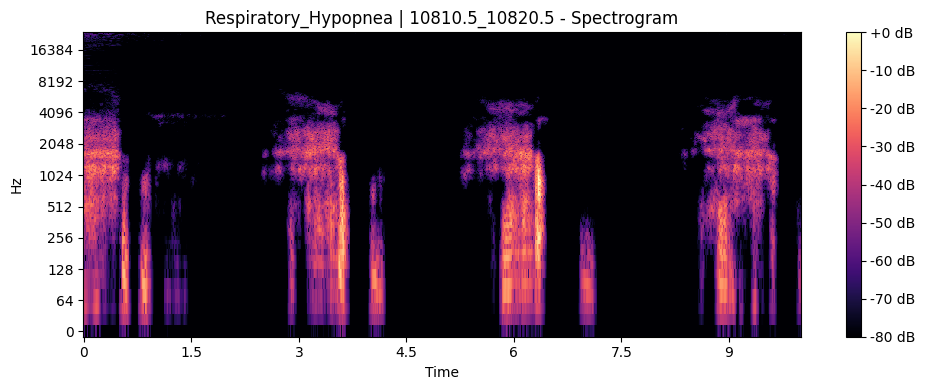

 Mean Zero Crossing Rate: 0.28442


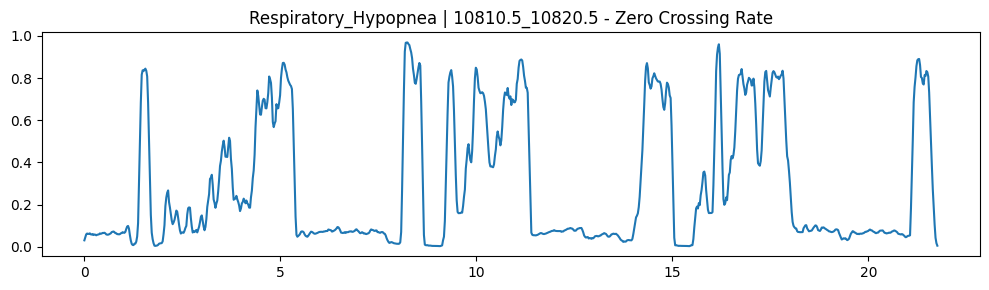


 Subcategory: 10909.5_10919.5
 Playing audio:


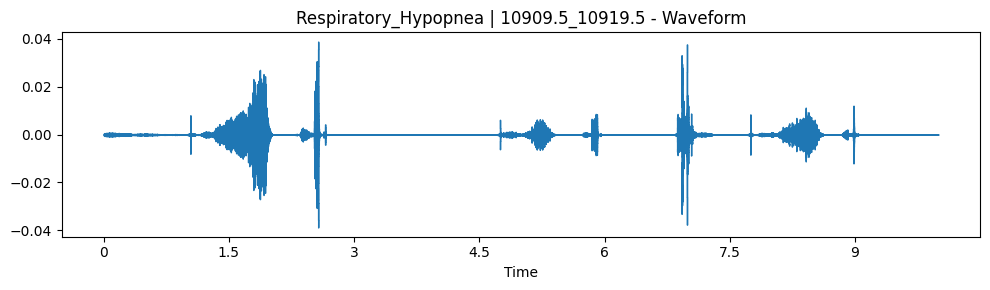

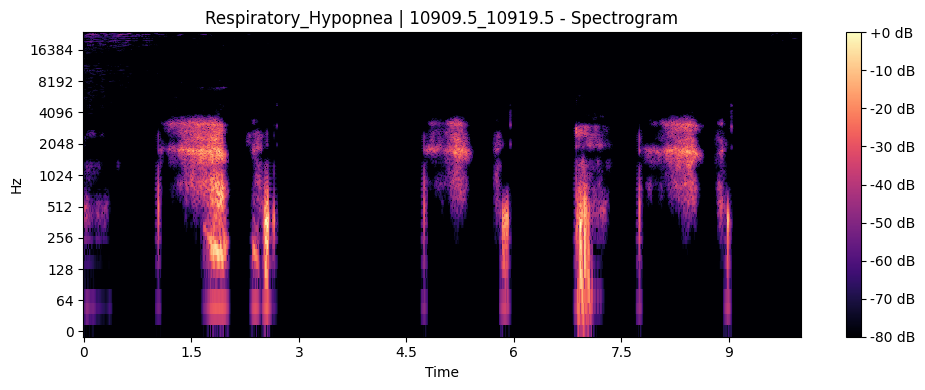

 Mean Zero Crossing Rate: 0.40717


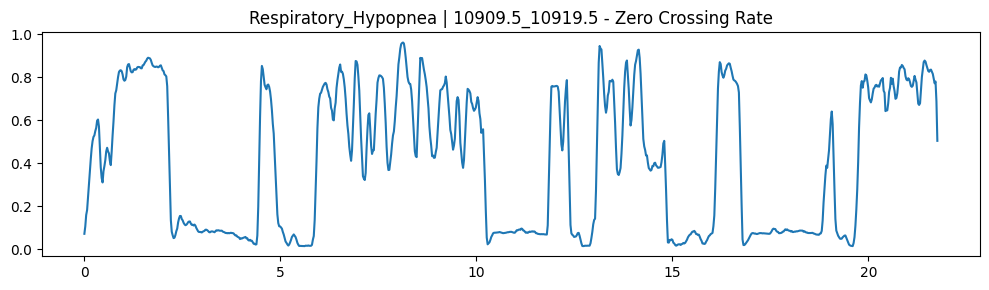


 Subcategory: 11084.0_11096.0
 Playing audio:


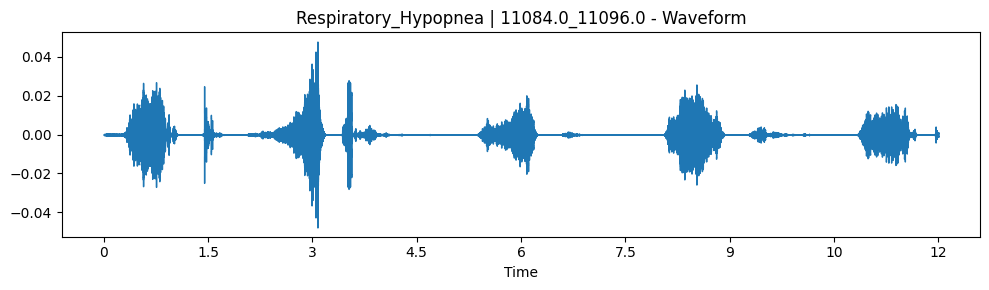

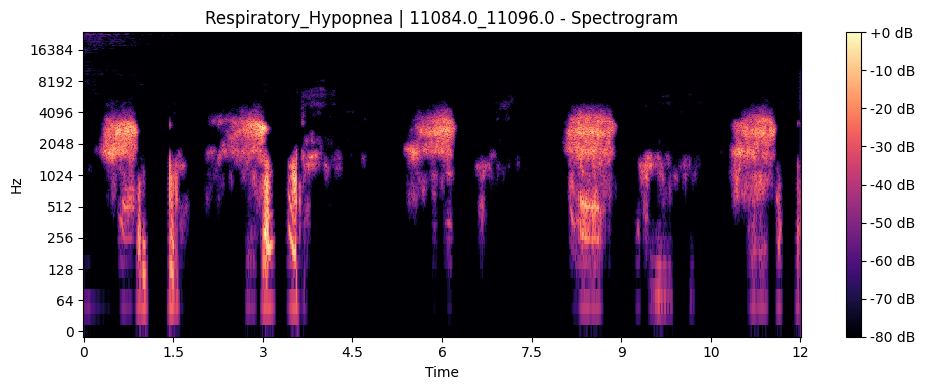

 Mean Zero Crossing Rate: 0.25344


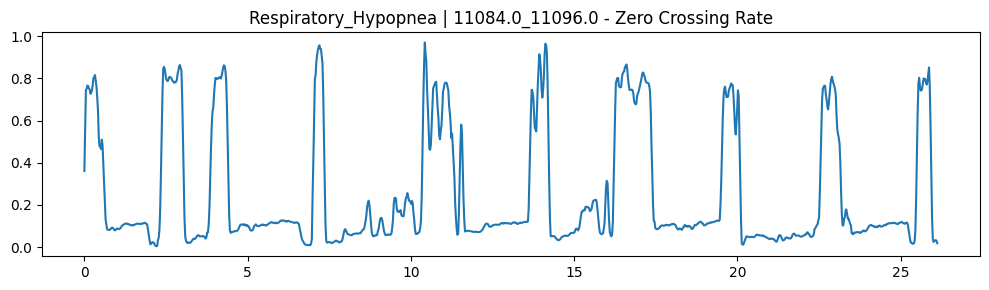


 Subcategory: 11175.0_11187.5
 Playing audio:


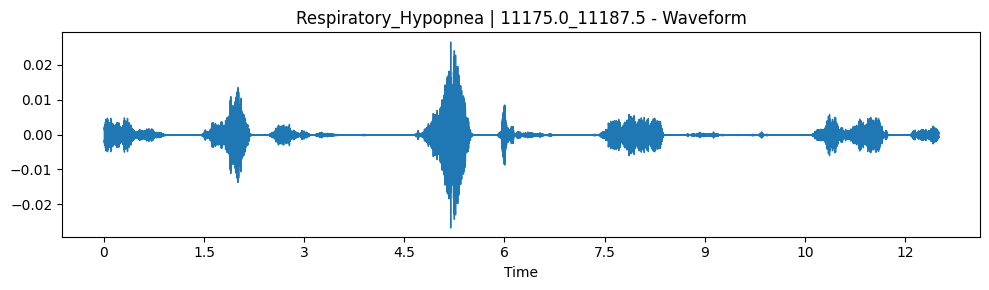

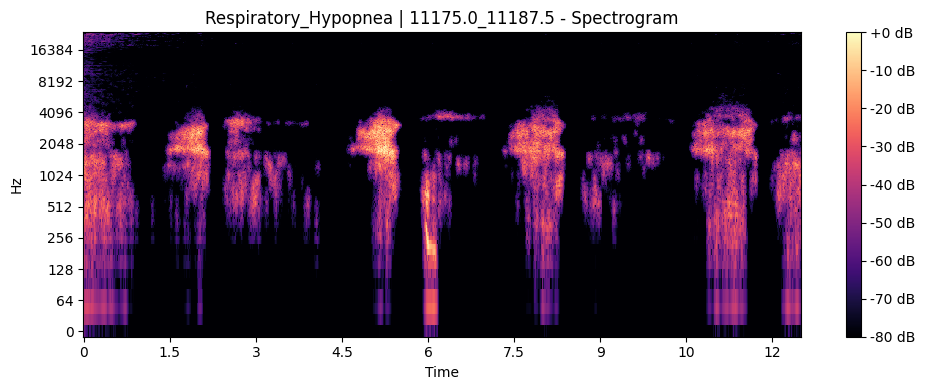

 Mean Zero Crossing Rate: 0.20376


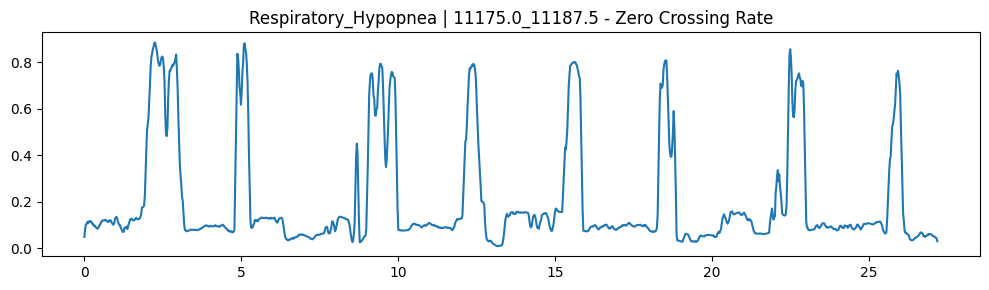


 Subcategory: 11310.5_11321.5
 Playing audio:


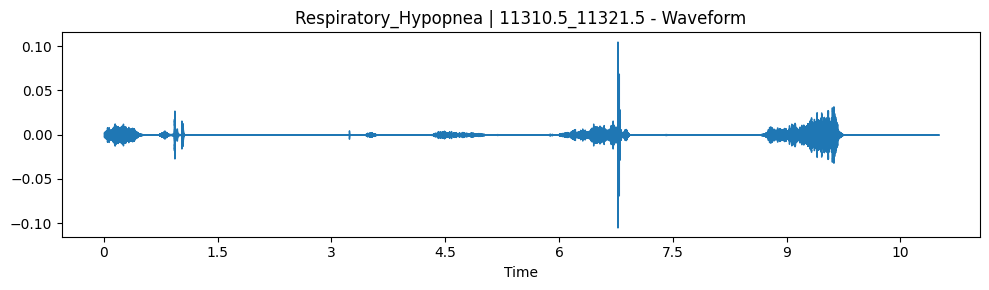

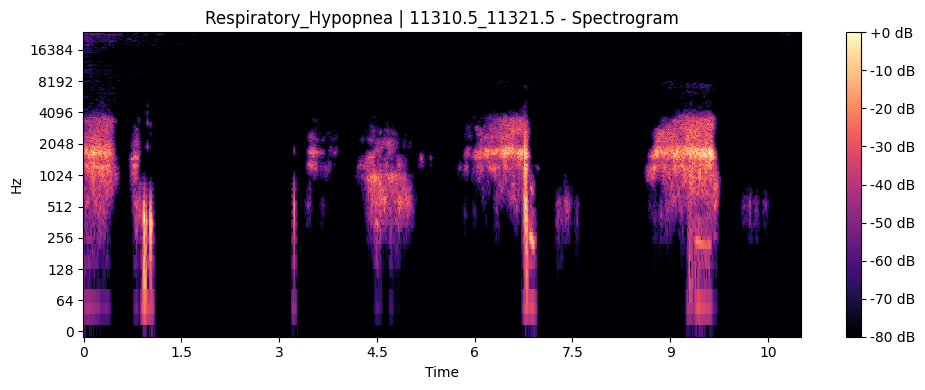

 Mean Zero Crossing Rate: 0.34267


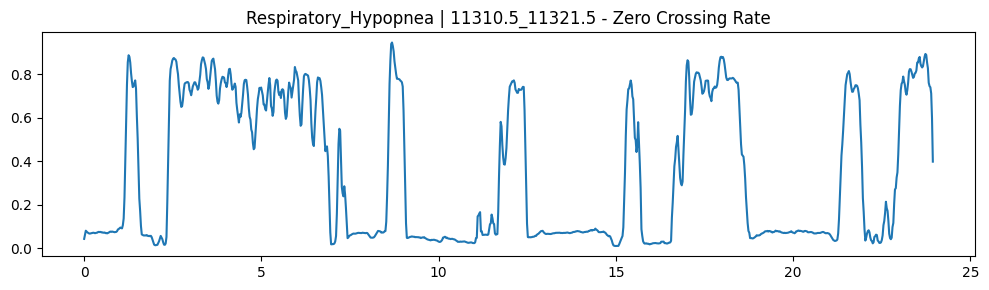


 Subcategory: 11361.0_11372.0
 Playing audio:


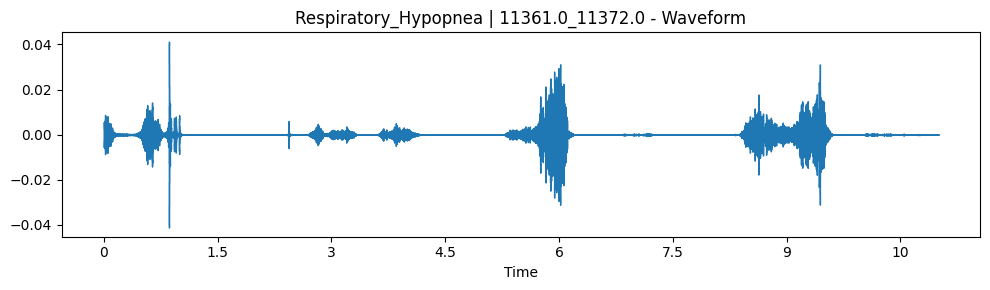

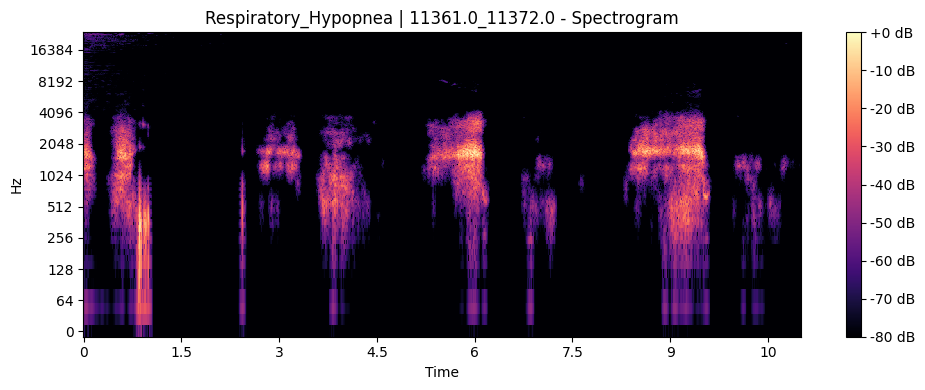

 Mean Zero Crossing Rate: 0.29897


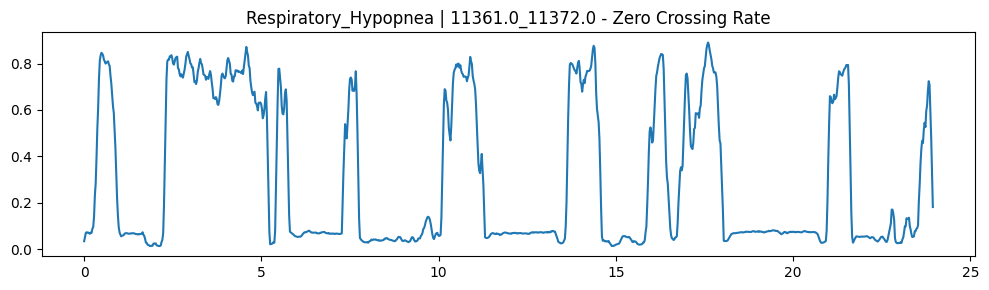

In [ ]:
# STEP 5: Category Navigation

while True:
    print("\n Choose a category to explore:")
    print("1: Respiratory_Hypopnea")
    print("2: Respiratory_ObstructiveApnea")
    print("3: Respiratory_MixedApnea")
    print("q: Quit")

    choice = input("Enter choice (1/2/3/q): ").strip().lower()

    if choice == 'q':
        print("Exiting session.")
        break

    if choice not in category_map:
        print("❗ Invalid input. Please enter 1, 2, 3, or q.")
        continue

    selected_category = category_map[choice]


    
    subcats = sorted(file_structure[selected_category].items())

    print(f"\n Exploring: {selected_category} ({len(subcats)} segments)")

    for timestamp, file_path in subcats:
        print(f"\n Subcategory: {timestamp}")
        y, sr = librosa.load(file_path, sr=None)
        show_features(y, sr, f"{selected_category} | {timestamp}")

        proceed = input("Press Enter for next, or 'm' to go back to menu: ").strip().lower()
        if proceed == 'm':
            break  # Return to category selection